<a href="https://colab.research.google.com/github/PnZheng/DeepLearning/blob/main/GAN/Face_generation_using_Conditional_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 数据集的获取 和 处理

In [ ]:
!wget https://www.dropbox.com/s/rbajpdlh7efkdo1/male_female_face_images.zip
!unzip -q male_female_face_images.zip

一些必要包的引入

In [1]:
from torch_snippets import *
device = "cuda" if torch.cuda.is_available() else "cpu"
from torchvision.utils import make_grid
from torch_snippets import *
from PIL import Image
import torchvision
from torchvision import transforms
import torchvision.utils as vutils

2021-09-06 13:25:41.416 | WARNING  | torch_snippets:<module>:13 - sklearn is not found. Skipping relevant imports from submodule `sklegos`
Exception: No module named 'sklego'


In [2]:
female_images = Glob('./face_images/females/*.jpg')
male_images = Glob('./face_images/males/*.jpg')

2021-09-06 13:25:43.059 | INFO     | torch_snippets.paths:inner:24 - 14688 files found at ./face_images/females/*.jpg
2021-09-06 13:25:43.179 | INFO     | torch_snippets.paths:inner:24 - 13948 files found at ./face_images/males/*.jpg


In [3]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

In [4]:
!mkdir cropped_faces_female
!mkdir cropped_faces_male
for i in range(len(female_images)):
    img = read(female_images[i],1)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    for (x,y,w,h) in faces:
        img2 = img[y:(y+h),x:(x+w),:]
    cv2.imwrite('cropped_faces_female/'+str(i)+'.jpg',cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))
for i in range(len(male_images)):
    img = read(male_images[i],1)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    for (x,y,w,h) in faces:
        img2 = img[y:(y+h),x:(x+w),:]
    cv2.imwrite('cropped_faces_male/'+str(i)+'.jpg',cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))

A subdirectory or file cropped_faces_female already exists.
A subdirectory or file cropped_faces_male already exists.


KeyboardInterrupt: 

在这里我们利用ConGAN来指定人脸生成模型生成的人脸的性别，因此需要对数据集进行划分为：female和male两个数据集，因此生成两个文件夹：cropped_faces_female和cropped_faces_male

### 定义transform来对展示每一张图像

In [20]:
transform=transforms.Compose([
                               transforms.Resize(64),
                               transforms.CenterCrop(64),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

### 定义Face类，并且返还对应图像的性别特征

In [33]:
class Faces(Dataset):
    def __init__(self, folders):
        super().__init__()
        self.folderfemale = folders[0]
        self.foldermale = folders[1]
        self.images=sorted(Glob(self.folderfemale))+sorted(Glob(self.foldermale))
    def __len__(self):
        return len(self.images)
    def __getitem__(self, ix):
        image_path = self.images[ix]
        image = Image.open(image_path)
        image = transform(image)
        gender = np.where('female' in str(image_path),1,0)
        return image, torch.tensor(gender).long()

In [36]:
ds = Faces(folders=['cropped_faces_female','cropped_faces_male'])
dataloader = DataLoader(ds, batch_size=64, shuffle=True)

2021-09-06 14:17:11.015 | INFO     | torch_snippets.paths:inner:24 - 14688 files found at cropped_faces_female
2021-09-06 14:17:11.250 | INFO     | torch_snippets.paths:inner:24 - 13948 files found at cropped_faces_male


### 权重初始化

In [23]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### 判别器的定义
与DCGAN不同的是，这里添加了emb_size=32的这个参数，并且利用Embedding网络将对应的标签二维输入转换为32维度的向量，并将其存在label_embeddings中。

在最后进行链接后，再用model2模型进行第二层的卷积处理，以进行分类练习的训练。

In [24]:
class Discriminator(nn.Module):
    def __init__(self, emb_size=32):
        super(Discriminator, self).__init__()
        self.emb_size = 32
        self.label_embeddings = nn.Embedding(2, self.emb_size)
        self.model = nn.Sequential(
            nn.Conv2d(3,64,4,2,1,bias=False),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64,64*2,4,2,1,bias=False),
            nn.BatchNorm2d(64*2),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*2,64*4,4,2,1,bias=False),
            nn.BatchNorm2d(64*4),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*4,64*8,4,2,1,bias=False),
            nn.BatchNorm2d(64*8),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*8,64,4,2,1,bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Flatten()
        )
        self.model2 = nn.Sequential(
            nn.Linear(288,100),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(100,1),
            nn.Sigmoid()
        )
        self.apply(weights_init)
    def forward(self, input, labels):
        x = self.model(input)
        y = self.label_embeddings(labels)
        input = torch.cat([x, y], 1)
        final_output = self.model2(input)
        return final_output

In [25]:
!pip install torch_summary
from torchsummary import summary
discriminator = Discriminator().to(device)
summary(discriminator,torch.zeros(32,3,64,64).to(device), torch.zeros(32).long().to(device));

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple/
Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 256]                 --
|    └─Conv2d: 2-1                       [-1, 64, 32, 32]          3,072
|    └─LeakyReLU: 2-2                    [-1, 64, 32, 32]          --
|    └─Conv2d: 2-3                       [-1, 128, 16, 16]         131,072
|    └─BatchNorm2d: 2-4                  [-1, 128, 16, 16]         256
|    └─LeakyReLU: 2-5                    [-1, 128, 16, 16]         --
|    └─Conv2d: 2-6                       [-1, 256, 8, 8]           524,288
|    └─BatchNorm2d: 2-7                  [-1, 256, 8, 8]           512
|    └─LeakyReLU: 2-8                    [-1, 256, 8, 8]           --
|    └─Conv2d: 2-9                       [-1, 512, 4, 4]           2,097,152
|    └─BatchNorm2d: 2-10                 [-1, 512, 4, 4]           1,024
|    └─LeakyReLU: 2-11                   [-1, 512, 4, 4]           -

### 生成器的定义
利用nn.ConvTranspose2d去获得输出的图像数据，这里最后利用的是Tanh作为激活函数。

In [26]:
class Generator(nn.Module):
    def __init__(self, emb_size=32):
        super(Generator,self).__init__()
        self.emb_size = emb_size
        self.label_embeddings = nn.Embedding(2, self.emb_size)
        self.model = nn.Sequential(
            nn.ConvTranspose2d(100+self.emb_size,64*8,4,1,0,bias=False),
            nn.BatchNorm2d(64*8),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*8,64*4,4,2,1,bias=False),
            nn.BatchNorm2d(64*4),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*4,64*2,4,2,1,bias=False),
            nn.BatchNorm2d(64*2),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*2,64,4,2,1,bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64,3,4,2,1,bias=False),
            nn.Tanh()
        )
        self.apply(weights_init)
    def forward(self,input_noise,labels):
        label_embeddings = self.label_embeddings(labels).view(len(labels), self.emb_size, 1, 1)
        input = torch.cat([input_noise, label_embeddings], 1)
        return self.model(input)

In [27]:
generator = Generator().to(device)
summary(generator,torch.zeros(32,100,1,1).to(device), torch.zeros(32).long().to(device));

Layer (type:depth-idx)                   Output Shape              Param #
├─Embedding: 1-1                         [-1, 32]                  64
├─Sequential: 1-2                        [-1, 3, 64, 64]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           1,081,344
|    └─BatchNorm2d: 2-2                  [-1, 512, 4, 4]           1,024
|    └─ReLU: 2-3                         [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-4              [-1, 256, 8, 8]           2,097,152
|    └─BatchNorm2d: 2-5                  [-1, 256, 8, 8]           512
|    └─ReLU: 2-6                         [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-7              [-1, 128, 16, 16]         524,288
|    └─BatchNorm2d: 2-8                  [-1, 128, 16, 16]         256
|    └─ReLU: 2-9                         [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-10             [-1, 64, 32, 32]          131,072
|    └─BatchNorm2d: 2-11                 [-1, 64, 32, 32

### 生成输入的噪声数据

In [28]:
def noise(size):
    n = torch.randn(size, 100, 1, 1, device=device)
    return n.to(device)

### 判别器和生成器的训练处理函数
其中判别器中有四个输入：real_data, real_labels, fake_data, fake_labels

In [29]:
def discriminator_train_step(real_data, real_labels, fake_data, fake_labels):
    d_optimizer.zero_grad()
    prediction_real = discriminator(real_data, real_labels)
    error_real = loss(prediction_real, torch.ones(len(real_data), 1).to(device))
    error_real.backward()
    prediction_fake = discriminator(fake_data, fake_labels)
    error_fake = loss(prediction_fake, torch.zeros(len(fake_data), 1).to(device))
    error_fake.backward()
    d_optimizer.step()    
    return error_real + error_fake

In [30]:
def generator_train_step(fake_data, fake_labels):
    g_optimizer.zero_grad()
    prediction = discriminator(fake_data, fake_labels)
    error = loss(prediction, torch.ones(len(fake_data), 1).to(device))
    error.backward()
    g_optimizer.step()
    return error

### 定义生成器、判别器、损失函数和优化器
- 在这里我们定义了fixed_noise来作为生成器的随机噪声输入
- 并且定义fixed_fake_labels将噪声输入的一半定义为类0（男生）和类1（女生）。

In [31]:
discriminator = Discriminator().to(device)
generator = Generator().to(device)
loss = nn.BCELoss()
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
fixed_noise = torch.randn(64, 100, 1, 1, device=device)
fixed_fake_labels = torch.LongTensor([0]*(len(fixed_noise)//2) + [1]*(len(fixed_noise)//2)).to(device)
loss = nn.BCELoss()
n_epochs = 25
img_list = []

EPOCH: 1.000	d_loss: 0.467	g_loss: 3.524	(798.08s - 19154.02s remaining)


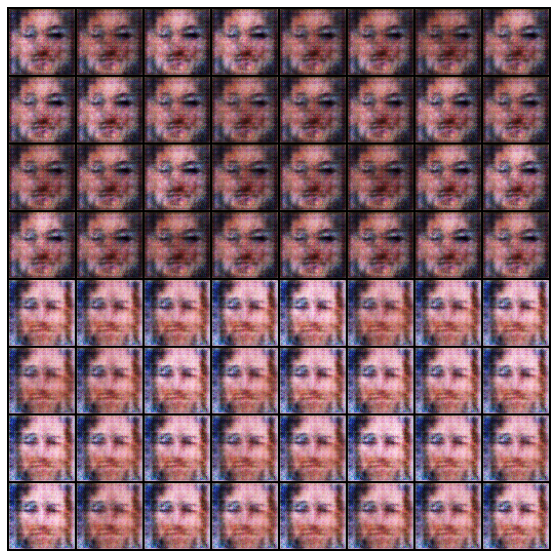

EPOCH: 2.000	d_loss: 0.470	g_loss: 4.364	(1121.53s - 12897.63s remaining)


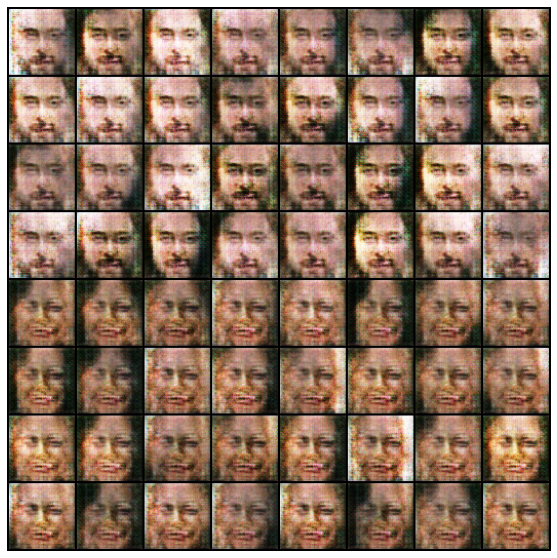

EPOCH: 3.000	d_loss: 0.448	g_loss: 5.393	(1516.54s - 11121.30s remaining)


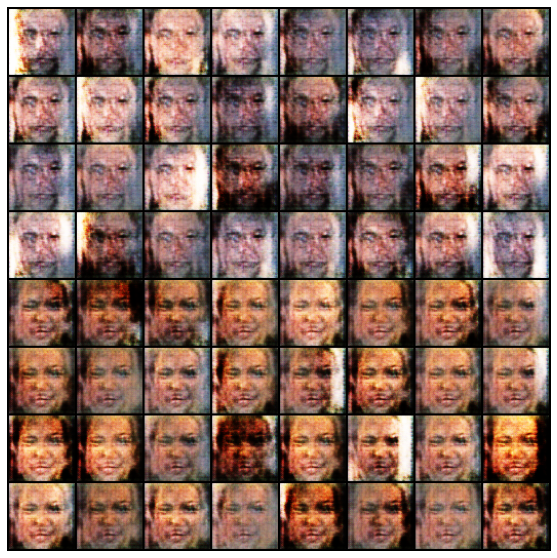

EPOCH: 4.000	d_loss: 0.397	g_loss: 5.647	(1942.98s - 10200.62s remaining))


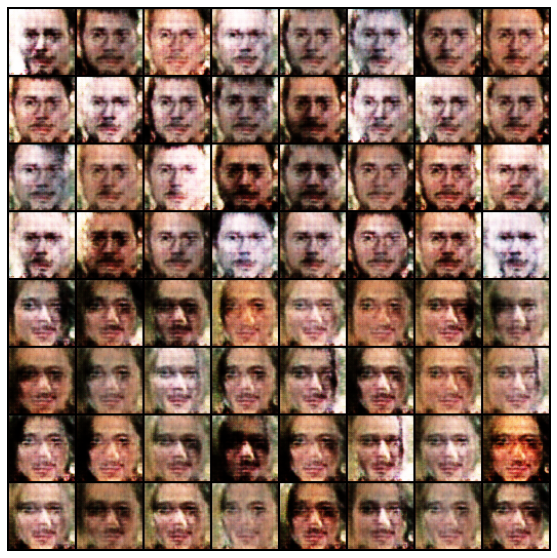

EPOCH: 5.000	d_loss: 0.449	g_loss: 5.583	(2367.81s - 9471.24s remaining)))


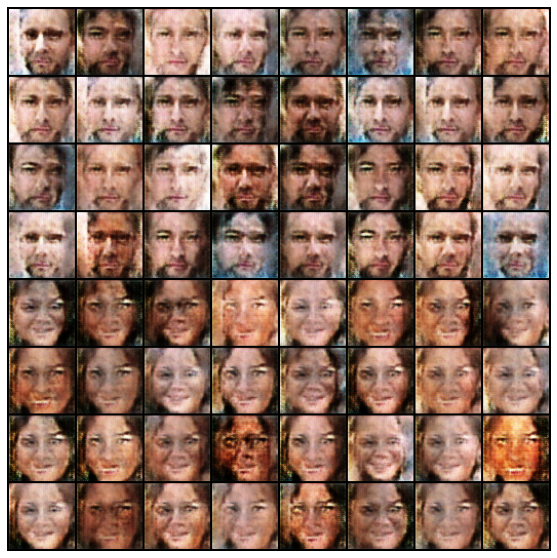

EPOCH: 6.000	d_loss: 0.487	g_loss: 5.545	(2792.62s - 8843.30s remaining))


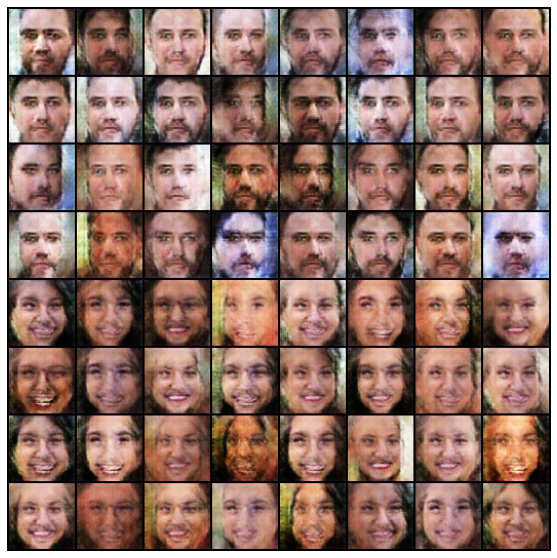

EPOCH: 7.000	d_loss: 0.504	g_loss: 5.125	(3221.15s - 8282.96s remaining))


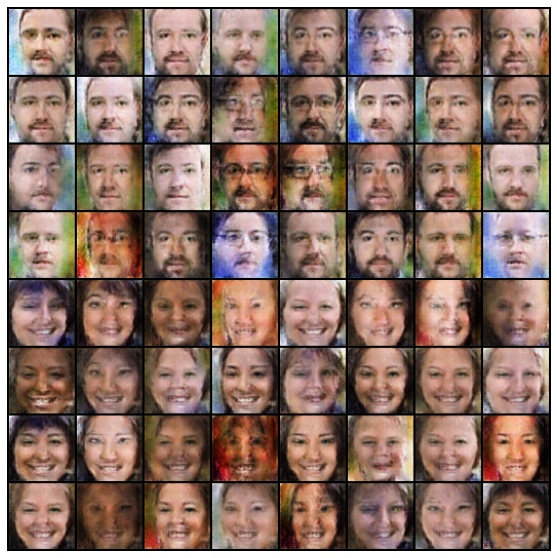

EPOCH: 8.000	d_loss: 0.497	g_loss: 4.859	(3675.85s - 7811.18s remaining))


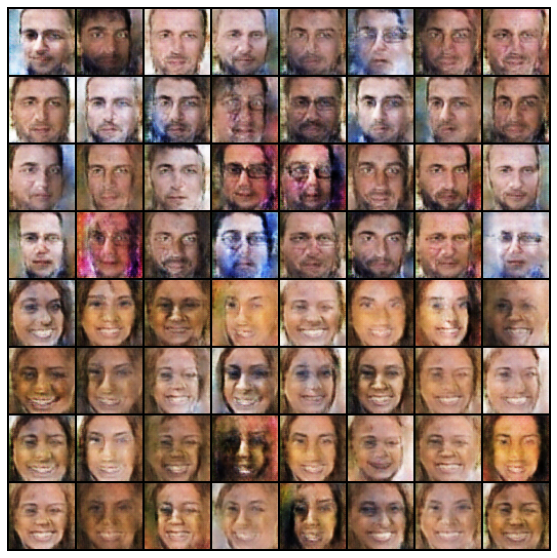

EPOCH: 9.000	d_loss: 0.469	g_loss: 4.822	(4098.05s - 7285.42s remaining))


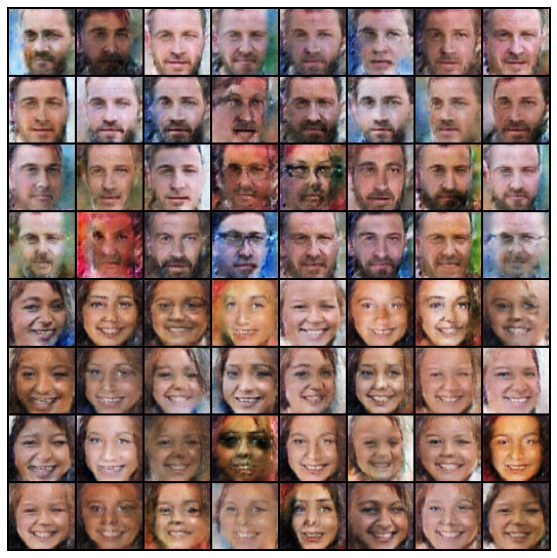

EPOCH: 10.000	d_loss: 0.478	g_loss: 4.603	(4521.64s - 6782.46s remaining)


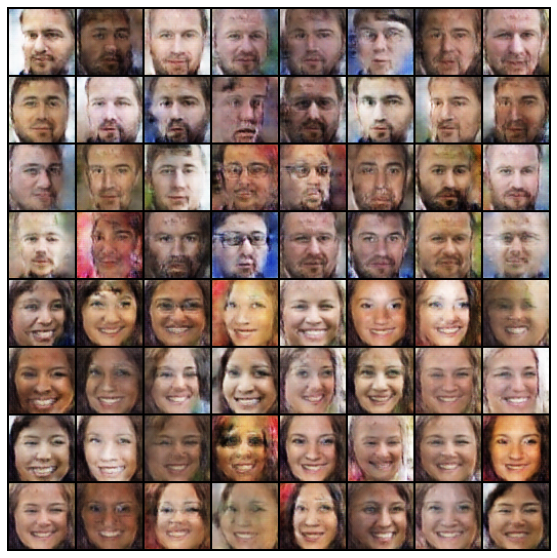

EPOCH: 11.000	d_loss: 0.490	g_loss: 4.561	(4945.13s - 6293.81s remaining))


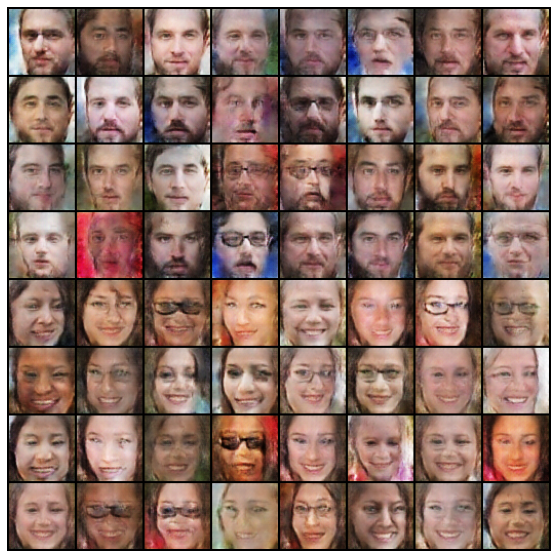

EPOCH: 12.000	d_loss: 0.470	g_loss: 4.519	(5367.89s - 5815.21s remaining))


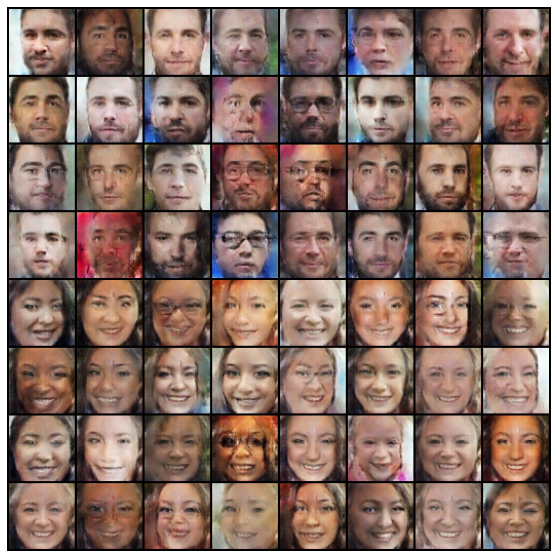

EPOCH: 13.000	d_loss: 0.469	g_loss: 4.443	(5849.84s - 5399.85s remaining))


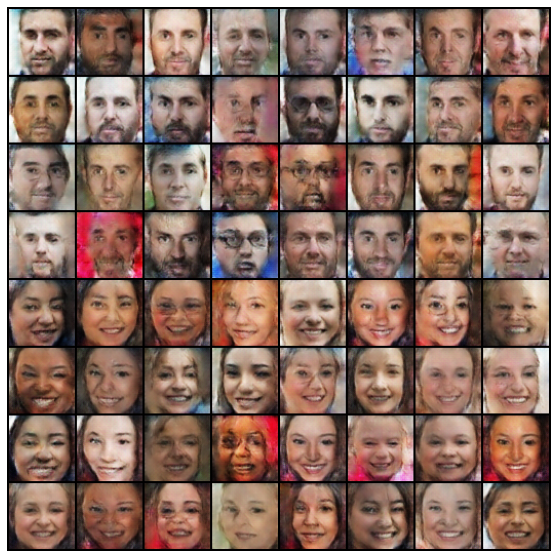

EPOCH: 13.743	d_loss: 0.092	g_loss: 5.643	(6188.79s - 5069.04s remaining)

KeyboardInterrupt: 

In [37]:
log = Report(n_epochs)
for epoch in range(n_epochs):
    N = len(dataloader)
    for bx, (images, labels) in enumerate(dataloader):
        real_data, real_labels = images.to(device), labels.to(device)
        fake_labels = torch.LongTensor(np.random.randint(0, 2, len(real_data))).to(device)
        fake_data = generator(noise(len(real_data)), fake_labels)
        fake_data = fake_data.detach()
        d_loss = discriminator_train_step(real_data, real_labels, fake_data, fake_labels)
        fake_labels = torch.LongTensor(np.random.randint(0, 2, len(real_data))).to(device)
        fake_data = generator(noise(len(real_data)), fake_labels).to(device)
        g_loss = generator_train_step(fake_data, fake_labels)
        pos = epoch + (1+bx)/N
        log.record(pos, d_loss=d_loss.detach(), g_loss=g_loss.detach(), end='\r')
    log.report_avgs(epoch+1)
    
    with torch.no_grad():
        fake = generator(fixed_noise, fixed_fake_labels).detach().cpu()
        imgs = vutils.make_grid(fake, padding=2, normalize=True).permute(1,2,0)
        img_list.append(imgs)
        show(imgs, sz=10)